# Deep Learning Watermark Detection

This notebook implements two deep learning approaches:
1. **U-Net**: Semantic segmentation to predict watermark masks
2. **Encoder-Decoder**: Image-to-image translation to remove watermarks

Dataset: 1,743 matching pairs of watermarked/non-watermarked images


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.utils import save_image

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")


Using device: cpu


## Load Matching Pairs Dataset


In [3]:
# Load matching pairs
from matching_pairs_list import matching_pairs

print(f"Total matching pairs: {len(matching_pairs)}")

# Split into train/validation/test
train_pairs, test_pairs = train_test_split(matching_pairs, test_size=0.15, random_state=42)
train_pairs, val_pairs = train_test_split(train_pairs, test_size=0.15, random_state=42)

print(f"Train: {len(train_pairs)} pairs")
print(f"Validation: {len(val_pairs)} pairs")
print(f"Test: {len(test_pairs)} pairs")


Total matching pairs: 1743
Train: 1258 pairs
Validation: 223 pairs
Test: 262 pairs


## Dataset Class


In [4]:
class WatermarkDataset(Dataset):
    """
    Dataset for watermark detection and removal.
    Returns: watermarked image, clean image, and watermark mask
    """
    def __init__(self, pairs, root_dir, img_size=256, transform=None):
        self.pairs = pairs
        self.root_dir = Path(root_dir)
        self.img_size = img_size
        self.transform = transform
        
        # Default transforms if none provided
        if self.transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((img_size, img_size)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
            ])
        
        # Transform for mask (no normalization)
        self.mask_transform = transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor()
        ])
    
    def __len__(self):
        return len(self.pairs)
    
    def __getitem__(self, idx):
        pair = self.pairs[idx]
        
        # Load watermarked and clean images
        watermark_path = self.root_dir / pair['watermark']
        clean_path = self.root_dir / pair['no_watermark']
        
        try:
            watermark_img = Image.open(watermark_path).convert('RGB')
            clean_img = Image.open(clean_path).convert('RGB')
            
            # Generate watermark mask by computing difference
            watermark_np = np.array(watermark_img.resize((self.img_size, self.img_size)))
            clean_np = np.array(clean_img.resize((self.img_size, self.img_size)))
            
            # Compute absolute difference and threshold to create binary mask
            diff = np.abs(watermark_np.astype(float) - clean_np.astype(float))
            mask = (diff.mean(axis=2) > 10).astype(np.uint8) * 255  # Threshold at 10
            mask_img = Image.fromarray(mask)
            
            # Apply transforms
            watermark_tensor = self.transform(watermark_img)
            clean_tensor = self.transform(clean_img)
            mask_tensor = self.mask_transform(mask_img)
            
            return watermark_tensor, clean_tensor, mask_tensor
        
        except Exception as e:
            print(f"Error loading {pair['filename']}: {e}")
            # Return zeros if loading fails
            return torch.zeros(3, self.img_size, self.img_size), \
                   torch.zeros(3, self.img_size, self.img_size), \
                   torch.zeros(1, self.img_size, self.img_size)


In [5]:
# Create datasets
IMG_SIZE = 256
BATCH_SIZE = 8

train_dataset = WatermarkDataset(train_pairs, root_dir='/Users/wesleykim/Classes/Columbia/COMS 4731/Final Project', img_size=IMG_SIZE)
val_dataset = WatermarkDataset(val_pairs, root_dir='/Users/wesleykim/Classes/Columbia/COMS 4731/Final Project', img_size=IMG_SIZE)
test_dataset = WatermarkDataset(test_pairs, root_dir='/Users/wesleykim/Classes/Columbia/COMS 4731/Final Project', img_size=IMG_SIZE)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")


Train batches: 158
Val batches: 28
Test batches: 33


## Visualize Sample Data


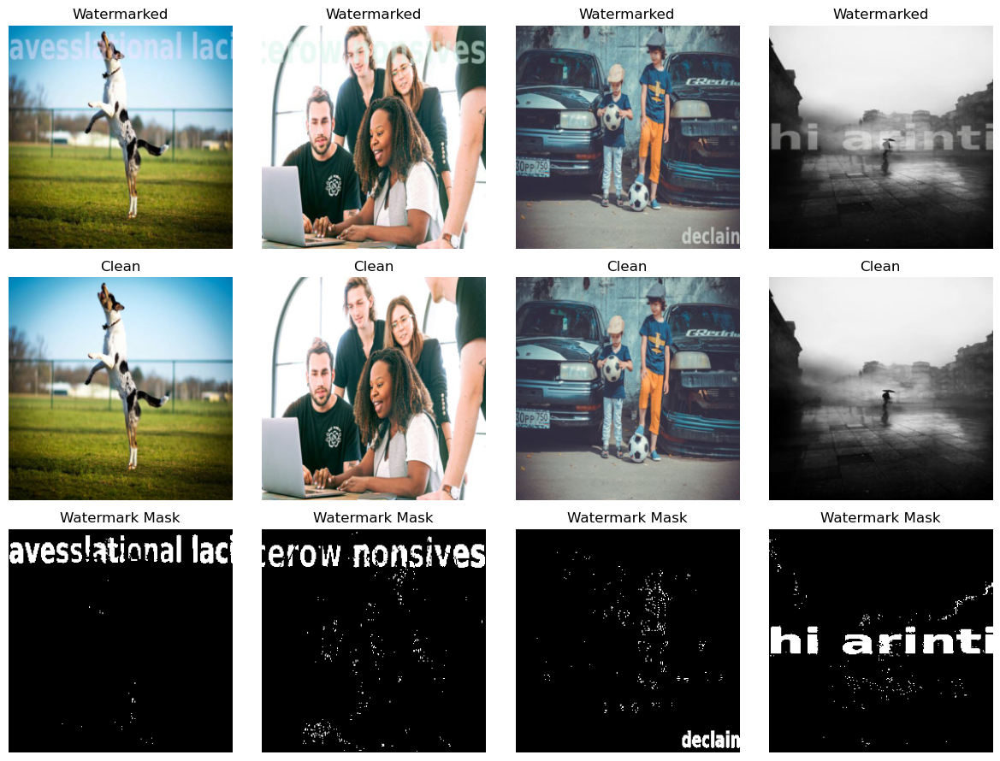

In [6]:
# Visualize a batch
watermark_batch, clean_batch, mask_batch = next(iter(train_loader))

fig, axes = plt.subplots(3, 4, figsize=(12, 9))
for i in range(4):
    # Denormalize for visualization
    watermark_img = watermark_batch[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
    clean_img = clean_batch[i].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
    mask_img = mask_batch[i].cpu().squeeze().numpy()
    
    axes[0, i].imshow(watermark_img)
    axes[0, i].set_title('Watermarked')
    axes[0, i].axis('off')
    
    axes[1, i].imshow(clean_img)
    axes[1, i].set_title('Clean')
    axes[1, i].axis('off')
    
    axes[2, i].imshow(mask_img, cmap='gray')
    axes[2, i].set_title('Watermark Mask')
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()


## Model 1: U-Net for Watermark Segmentation

U-Net architecture with encoder-decoder structure and skip connections for precise localization.


In [7]:
class DoubleConv(nn.Module):
    """(Conv => BN => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    """U-Net for watermark segmentation"""
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        # Encoder (downsampling)
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)
        
        # Decoder (upsampling)
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        enc4 = self.enc4(self.pool3(enc3))
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Decoder with skip connections
        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)
        
        # Output
        out = self.out(dec1)
        out = self.sigmoid(out)
        
        return out


In [8]:
# Initialize U-Net
unet = UNet(in_channels=3, out_channels=1).to(device)
print(f"U-Net parameters: {sum(p.numel() for p in unet.parameters()):,}")


U-Net parameters: 31,043,521


## Model 2: Encoder-Decoder for Watermark Removal

Encoder-Decoder architecture for image-to-image translation (watermarked → clean).


In [9]:
class EncoderDecoder(nn.Module):
    """Encoder-Decoder for watermark removal (watermarked -> clean)"""
    def __init__(self, in_channels=3, out_channels=3):
        super().__init__()
        
        # Encoder
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True)
        )
        
        # Decoder
        self.dec4 = nn.Sequential(
            nn.ConvTranspose2d(512, 512, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        
        self.dec3 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        
        self.dec2 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        
        self.dec1 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        
        # Output
        self.out = nn.Sequential(
            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
    
    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(enc1)
        enc3 = self.enc3(enc2)
        enc4 = self.enc4(enc3)
        
        # Bottleneck
        bottleneck = self.bottleneck(enc4)
        
        # Decoder
        dec4 = self.dec4(bottleneck)
        dec3 = self.dec3(dec4)
        dec2 = self.dec2(dec3)
        dec1 = self.dec1(dec2)
        
        # Output
        out = self.out(dec1)
        
        return out


In [10]:
# Initialize Encoder-Decoder
encoder_decoder = EncoderDecoder(in_channels=3, out_channels=3).to(device)
print(f"Encoder-Decoder parameters: {sum(p.numel() for p in encoder_decoder.parameters()):,}")


Encoder-Decoder parameters: 13,905,923


## Training Functions


In [11]:
def train_unet(model, train_loader, val_loader, epochs=20, lr=0.001):
    """
    Train U-Net for watermark segmentation.
    Uses Binary Cross Entropy loss for mask prediction.
    """
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)
    
    train_losses = []
    val_losses = []
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0.0
        
        for watermark_imgs, clean_imgs, mask_imgs in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
            watermark_imgs = watermark_imgs.to(device)
            mask_imgs = mask_imgs.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass
            pred_masks = model(watermark_imgs)
            loss = criterion(pred_masks, mask_imgs)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation
        model.eval()
        val_loss = 0.0
        
        with torch.no_grad():
            for watermark_imgs, clean_imgs, mask_imgs in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                watermark_imgs = watermark_imgs.to(device)
                mask_imgs = mask_imgs.to(device)
                
                pred_masks = model(watermark_imgs)
                loss = criterion(pred_masks, mask_imgs)
                
                val_loss += loss.item()
        
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        
        scheduler.step(val_loss)
        
        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        
        # Save checkpoint
        if (epoch + 1) % 5 == 0:
            torch.save(model.state_dict(), f'unet_epoch_{epoch+1}.pth')
    
    return train_losses, val_losses

def train_encoder_decoder(model, train_loader, val_loader, epochs=20, lr=0.001):
    """
    Train Encoder-Decoder for watermark removal.
    Uses L1 loss for image reconstruction.
    """
    criterion = nn.L1Loss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)
    
    train_losses = []
    val_losses = []
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0.0
        
        for watermark_imgs, clean_imgs, mask_imgs in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]"):
            watermark_imgs = watermark_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass
            pred_clean = model(watermark_imgs)
            loss = criterion(pred_clean, clean_imgs)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation
        model.eval()
        val_loss = 0.0
        
        with torch.no_grad():
            for watermark_imgs, clean_imgs, mask_imgs in tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]"):
                watermark_imgs = watermark_imgs.to(device)
                clean_imgs = clean_imgs.to(device)
                
                pred_clean = model(watermark_imgs)
                loss = criterion(pred_clean, clean_imgs)
                
                val_loss += loss.item()
        
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        
        scheduler.step(val_loss)
        
        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
        
        # Save checkpoint
        if (epoch + 1) % 5 == 0:
            torch.save(model.state_dict(), f'encoder_decoder_epoch_{epoch+1}.pth')
    
    return train_losses, val_losses


## Train U-Net


In [12]:
# Train U-Net
print("Training U-Net for Watermark Segmentation...")
unet_train_losses, unet_val_losses = train_unet(unet, train_loader, val_loader, epochs=20, lr=0.001)


Training U-Net for Watermark Segmentation...


Epoch 1/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 1/20 - Train Loss: 0.2009, Val Loss: 0.1315


Epoch 2/20 [Val]: 100%|██████████| 28/28 [00:29<00:00,  1.06s/it]


Epoch 2/20 - Train Loss: 0.1218, Val Loss: 0.1153


Epoch 3/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 3/20 - Train Loss: 0.1074, Val Loss: 0.0955


Epoch 4/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 4/20 - Train Loss: 0.0977, Val Loss: 0.0905


Epoch 5/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 5/20 - Train Loss: 0.0955, Val Loss: 0.0832


Epoch 6/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 6/20 - Train Loss: 0.0905, Val Loss: 0.0858


Epoch 7/20 [Val]: 100%|██████████| 28/28 [00:31<00:00,  1.12s/it]


Epoch 7/20 - Train Loss: 0.0867, Val Loss: 0.0745


Epoch 8/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 8/20 - Train Loss: 0.0848, Val Loss: 0.0804


Epoch 9/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 9/20 - Train Loss: 0.0817, Val Loss: 0.0725


Epoch 10/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 10/20 - Train Loss: 0.0792, Val Loss: 0.0687


Epoch 11/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 11/20 - Train Loss: 0.0778, Val Loss: 0.0676


Epoch 12/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 12/20 - Train Loss: 0.0771, Val Loss: 0.0787


Epoch 13/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.07s/it]


Epoch 13/20 - Train Loss: 0.0757, Val Loss: 0.0723


Epoch 14/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 14/20 - Train Loss: 0.0736, Val Loss: 0.0752


Epoch 15/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 15/20 - Train Loss: 0.0711, Val Loss: 0.0838


Epoch 16/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 16/20 - Train Loss: 0.0686, Val Loss: 0.0632


Epoch 17/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]


Epoch 17/20 - Train Loss: 0.0657, Val Loss: 0.0588


Epoch 18/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 18/20 - Train Loss: 0.0629, Val Loss: 0.0606


Epoch 19/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.09s/it]


Epoch 19/20 - Train Loss: 0.0625, Val Loss: 0.0579


Epoch 20/20 [Val]: 100%|██████████| 28/28 [00:30<00:00,  1.10s/it]

Epoch 20/20 - Train Loss: 0.0607, Val Loss: 0.0547


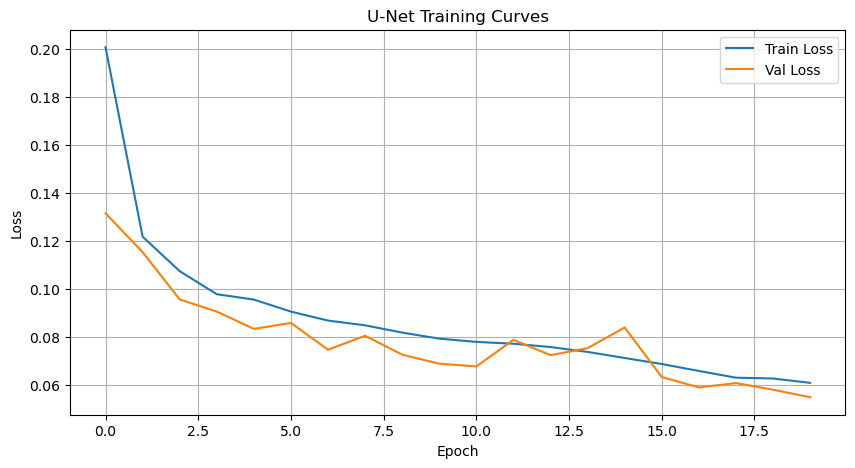

In [13]:
# Plot U-Net training curves
plt.figure(figsize=(10, 5))
plt.plot(unet_train_losses, label='Train Loss')
plt.plot(unet_val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('U-Net Training Curves')
plt.legend()
plt.grid(True)
plt.show()


## Train Encoder-Decoder


In [14]:
# Train Encoder-Decoder
print("Training Encoder-Decoder for Watermark Removal...")
ed_train_losses, ed_val_losses = train_encoder_decoder(encoder_decoder, train_loader, val_loader, epochs=20, lr=0.001)


Training Encoder-Decoder for Watermark Removal...


Epoch 1/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.15it/s]


Epoch 1/20 - Train Loss: 0.2823, Val Loss: 0.2194


Epoch 2/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.20it/s]


Epoch 2/20 - Train Loss: 0.2179, Val Loss: 0.2132


Epoch 3/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.13it/s]


Epoch 3/20 - Train Loss: 0.2067, Val Loss: 0.1739


Epoch 4/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.07it/s]


Epoch 4/20 - Train Loss: 0.2032, Val Loss: 0.1845


Epoch 5/20 [Val]: 100%|██████████| 28/28 [00:04<00:00,  6.96it/s]


Epoch 5/20 - Train Loss: 0.1935, Val Loss: 0.1658


Epoch 6/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.23it/s]


Epoch 6/20 - Train Loss: 0.1848, Val Loss: 0.1702


Epoch 7/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.10it/s]


Epoch 7/20 - Train Loss: 0.1807, Val Loss: 0.1636


Epoch 8/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.14it/s]


Epoch 8/20 - Train Loss: 0.1789, Val Loss: 0.1579


Epoch 9/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.16it/s]


Epoch 9/20 - Train Loss: 0.1724, Val Loss: 0.1489


Epoch 10/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.27it/s]


Epoch 10/20 - Train Loss: 0.1534, Val Loss: 0.1274


Epoch 11/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.14it/s]


Epoch 11/20 - Train Loss: 0.1464, Val Loss: 0.1404


Epoch 12/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.15it/s]


Epoch 12/20 - Train Loss: 0.1419, Val Loss: 0.1357


Epoch 13/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.21it/s]


Epoch 13/20 - Train Loss: 0.1422, Val Loss: 0.1256


Epoch 14/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.05it/s]


Epoch 14/20 - Train Loss: 0.1377, Val Loss: 0.1141


Epoch 15/20 [Val]: 100%|██████████| 28/28 [00:04<00:00,  6.93it/s]


Epoch 15/20 - Train Loss: 0.1367, Val Loss: 0.1161


Epoch 16/20 [Val]: 100%|██████████| 28/28 [00:04<00:00,  6.99it/s]


Epoch 16/20 - Train Loss: 0.1380, Val Loss: 0.1160


Epoch 17/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.15it/s]


Epoch 17/20 - Train Loss: 0.1360, Val Loss: 0.1348


Epoch 18/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.02it/s]


Epoch 18/20 - Train Loss: 0.1302, Val Loss: 0.1124


Epoch 19/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.05it/s]


Epoch 19/20 - Train Loss: 0.1295, Val Loss: 0.1186


Epoch 20/20 [Val]: 100%|██████████| 28/28 [00:03<00:00,  7.09it/s]

Epoch 20/20 - Train Loss: 0.1295, Val Loss: 0.1084


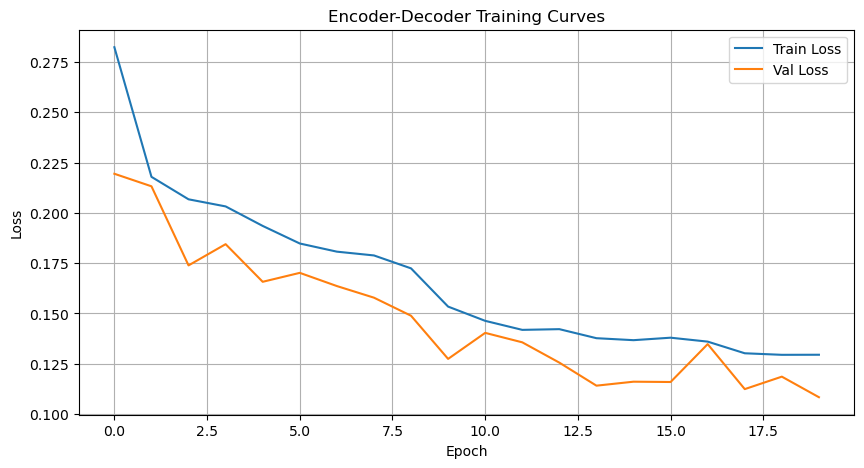

In [15]:
# Plot Encoder-Decoder training curves
plt.figure(figsize=(10, 5))
plt.plot(ed_train_losses, label='Train Loss')
plt.plot(ed_val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Encoder-Decoder Training Curves')
plt.legend()
plt.grid(True)
plt.show()


## Evaluation and Visualization


In [16]:
def visualize_results(model_unet, model_ed, test_loader, num_samples=5):
    """
    Visualize results from both models.
    """
    model_unet.eval()
    model_ed.eval()
    
    with torch.no_grad():
        watermark_imgs, clean_imgs, mask_imgs = next(iter(test_loader))
        watermark_imgs = watermark_imgs.to(device)
        clean_imgs = clean_imgs.to(device)
        mask_imgs = mask_imgs.to(device)
        
        # Get predictions
        pred_masks = model_unet(watermark_imgs)
        pred_clean = model_ed(watermark_imgs)
        
        # Move to CPU for visualization
        watermark_imgs = watermark_imgs.cpu()
        clean_imgs = clean_imgs.cpu()
        mask_imgs = mask_imgs.cpu()
        pred_masks = pred_masks.cpu()
        pred_clean = pred_clean.cpu()
        
        # Visualize
        fig, axes = plt.subplots(num_samples, 6, figsize=(18, 3*num_samples))
        
        for i in range(num_samples):
            # Denormalize images
            watermark = watermark_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            clean = clean_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            mask = mask_imgs[i].squeeze().numpy()
            pred_mask = pred_masks[i].squeeze().numpy()
            pred_c = pred_clean[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            
            axes[i, 0].imshow(watermark)
            axes[i, 0].set_title('Watermarked')
            axes[i, 0].axis('off')
            
            axes[i, 1].imshow(mask, cmap='gray')
            axes[i, 1].set_title('True Mask')
            axes[i, 1].axis('off')
            
            axes[i, 2].imshow(pred_mask, cmap='gray')
            axes[i, 2].set_title('U-Net Pred Mask')
            axes[i, 2].axis('off')
            
            axes[i, 3].imshow(pred_c)
            axes[i, 3].set_title('ED Pred Clean')
            axes[i, 3].axis('off')
            
            axes[i, 4].imshow(clean)
            axes[i, 4].set_title('True Clean')
            axes[i, 4].axis('off')
            
            # Difference map
            diff = np.abs(pred_c - clean)
            axes[i, 5].imshow(diff)
            axes[i, 5].set_title('Difference')
            axes[i, 5].axis('off')
        
        plt.tight_layout()
        plt.show()


## Encoder-Decoder Focused Visualization


In [21]:
def visualize_encoder_decoder(model_ed, test_loader, num_samples=5):
    """
    Focused visualization for Encoder-Decoder watermark removal.
    Shows: Watermarked Input → ED Prediction → Ground Truth Clean → Difference
    """
    model_ed.eval()
    
    with torch.no_grad():
        watermark_imgs, clean_imgs, mask_imgs = next(iter(test_loader))
        watermark_imgs = watermark_imgs.to(device)
        clean_imgs = clean_imgs.to(device)
        
        # Get predictions from Encoder-Decoder
        pred_clean = model_ed(watermark_imgs)
        
        # Move to CPU for visualization
        watermark_imgs = watermark_imgs.cpu()
        clean_imgs = clean_imgs.cpu()
        pred_clean = pred_clean.cpu()
        
        # Create figure
        fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
        
        for i in range(num_samples):
            # Denormalize images
            watermark = watermark_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            clean = clean_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            pred_c = pred_clean[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            
            # Clip to valid range
            watermark = np.clip(watermark, 0, 1)
            clean = np.clip(clean, 0, 1)
            pred_c = np.clip(pred_c, 0, 1)
            
            # Column 1: Watermarked Input
            axes[i, 0].imshow(watermark)
            axes[i, 0].set_title('Watermarked Input', fontsize=12, fontweight='bold')
            axes[i, 0].axis('off')
            
            # Column 2: Encoder-Decoder Prediction
            axes[i, 1].imshow(pred_c)
            axes[i, 1].set_title('ED Predicted Clean', fontsize=12, fontweight='bold')
            axes[i, 1].axis('off')
            
            # Column 3: Ground Truth Clean
            axes[i, 2].imshow(clean)
            axes[i, 2].set_title('Ground Truth Clean', fontsize=12, fontweight='bold')
            axes[i, 2].axis('off')
            
            # Column 4: Difference Map (Error)
            diff = np.abs(pred_c - clean)
            diff_enhanced = diff * 5  # Enhance for visibility
            diff_enhanced = np.clip(diff_enhanced, 0, 1)
            axes[i, 3].imshow(diff_enhanced)
            axes[i, 3].set_title('Difference (×5)', fontsize=12, fontweight='bold')
            axes[i, 3].axis('off')
        
        plt.suptitle('Encoder-Decoder Watermark Removal Results', fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()
        
        # Print quality metrics for these samples
        print("\n=== Sample Quality Metrics ===")
        for i in range(num_samples):
            watermark = watermark_imgs[i:i+1].to(device)
            clean = clean_imgs[i:i+1].to(device)
            pred = model_ed(watermark)
            
            l1 = torch.nn.functional.l1_loss(pred, clean).item()
            mse = torch.nn.functional.mse_loss(pred, clean).item()
            psnr = 10 * np.log10(1.0 / mse) if mse > 0 else 100
            
            print(f"Sample {i+1}: L1={l1:.4f}, MSE={mse:.4f}, PSNR={psnr:.2f} dB")


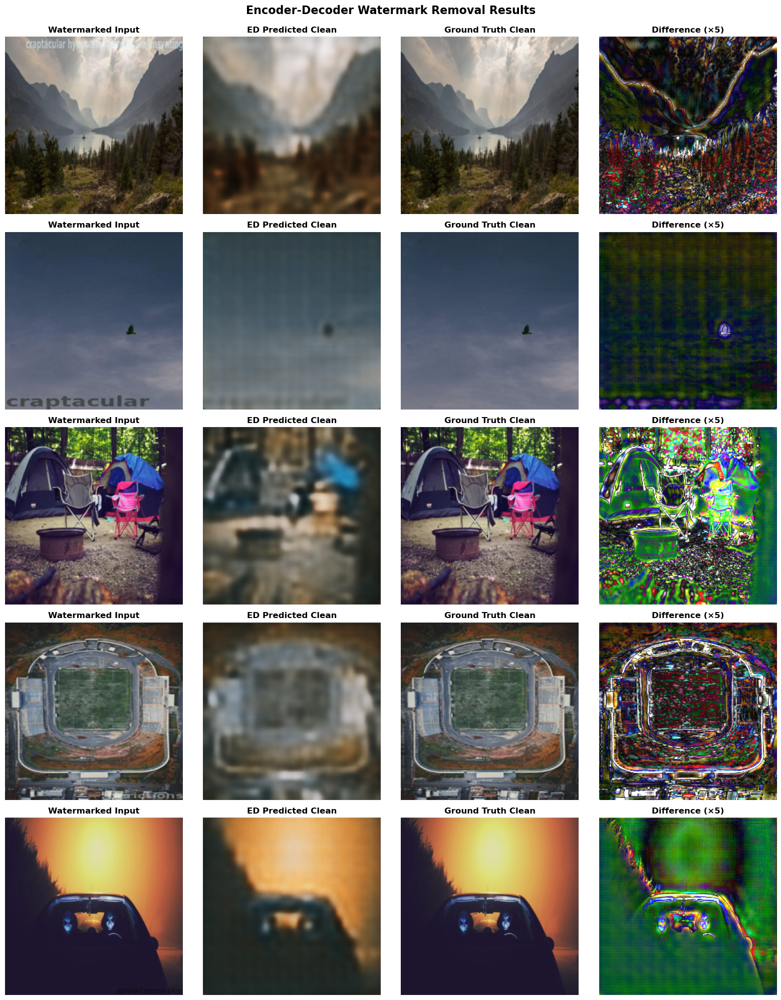


=== Sample Quality Metrics ===
Sample 1: L1=0.0729, MSE=0.0101, PSNR=19.98 dB
Sample 2: L1=0.0486, MSE=0.0033, PSNR=24.83 dB
Sample 3: L1=0.1573, MSE=0.0491, PSNR=13.09 dB
Sample 4: L1=0.1199, MSE=0.0291, PSNR=15.37 dB
Sample 5: L1=0.0961, MSE=0.0168, PSNR=17.74 dB


In [22]:
# Visualize Encoder-Decoder results
visualize_encoder_decoder(encoder_decoder, test_loader, num_samples=5)


## U-Net Focused Visualization


In [23]:
def visualize_unet(model_unet, test_loader, num_samples=5):
    """
    Focused visualization for U-Net watermark segmentation.
    Shows: Watermarked Input → Ground Truth Mask → U-Net Prediction → Overlay
    """
    model_unet.eval()
    
    with torch.no_grad():
        watermark_imgs, clean_imgs, mask_imgs = next(iter(test_loader))
        watermark_imgs = watermark_imgs.to(device)
        mask_imgs = mask_imgs.to(device)
        
        # Get predictions from U-Net
        pred_masks = model_unet(watermark_imgs)
        
        # Move to CPU for visualization
        watermark_imgs = watermark_imgs.cpu()
        mask_imgs = mask_imgs.cpu()
        pred_masks = pred_masks.cpu()
        
        # Create figure
        fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
        
        for i in range(num_samples):
            # Denormalize images
            watermark = watermark_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
            mask = mask_imgs[i].squeeze().numpy()
            pred_mask = pred_masks[i].squeeze().numpy()
            
            # Clip to valid range
            watermark = np.clip(watermark, 0, 1)
            
            # Column 1: Watermarked Input
            axes[i, 0].imshow(watermark)
            axes[i, 0].set_title('Watermarked Input', fontsize=12, fontweight='bold')
            axes[i, 0].axis('off')
            
            # Column 2: Ground Truth Mask
            axes[i, 1].imshow(mask, cmap='hot', vmin=0, vmax=1)
            axes[i, 1].set_title('Ground Truth Mask', fontsize=12, fontweight='bold')
            axes[i, 1].axis('off')
            
            # Column 3: U-Net Predicted Mask
            axes[i, 2].imshow(pred_mask, cmap='hot', vmin=0, vmax=1)
            axes[i, 2].set_title('U-Net Predicted Mask', fontsize=12, fontweight='bold')
            axes[i, 2].axis('off')
            
            # Column 4: Overlay (predicted mask on watermarked image)
            axes[i, 3].imshow(watermark)
            axes[i, 3].imshow(pred_mask, cmap='hot', alpha=0.5, vmin=0, vmax=1)
            axes[i, 3].set_title('Prediction Overlay', fontsize=12, fontweight='bold')
            axes[i, 3].axis('off')
        
        plt.suptitle('U-Net Watermark Segmentation Results', fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()
        
        # Print segmentation metrics for these samples
        print("\n=== Sample Segmentation Metrics ===")
        for i in range(num_samples):
            mask_true = mask_imgs[i].flatten().numpy()
            mask_pred = (pred_masks[i] > 0.5).float().flatten().numpy()
            
            # Calculate IoU (Intersection over Union)
            intersection = np.logical_and(mask_true, mask_pred).sum()
            union = np.logical_or(mask_true, mask_pred).sum()
            iou = intersection / union if union > 0 else 0
            
            # Calculate pixel accuracy
            accuracy = (mask_true == mask_pred).mean()
            
            print(f"Sample {i+1}: IoU={iou:.4f}, Accuracy={accuracy:.4f}")


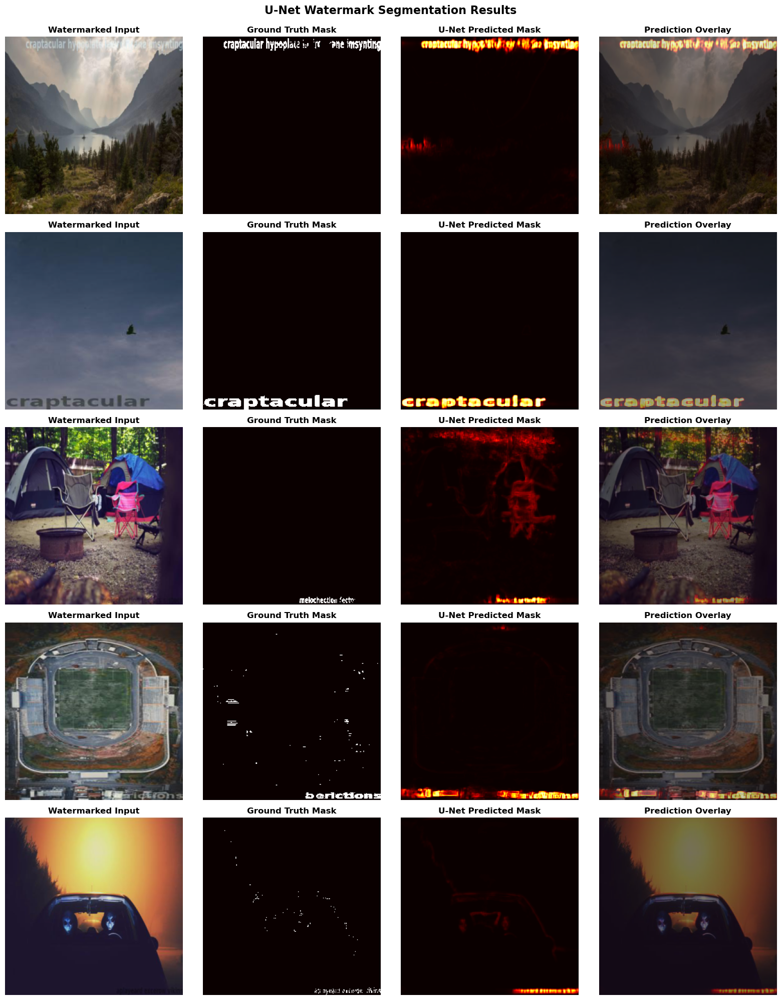


=== Sample Segmentation Metrics ===
Sample 1: IoU=0.5304, Accuracy=0.9849
Sample 2: IoU=0.8516, Accuracy=0.9959
Sample 3: IoU=0.3917, Accuracy=0.9958
Sample 4: IoU=0.3445, Accuracy=0.9869
Sample 5: IoU=0.2659, Accuracy=0.9954


In [24]:
# Visualize U-Net results
visualize_unet(unet, test_loader, num_samples=5)


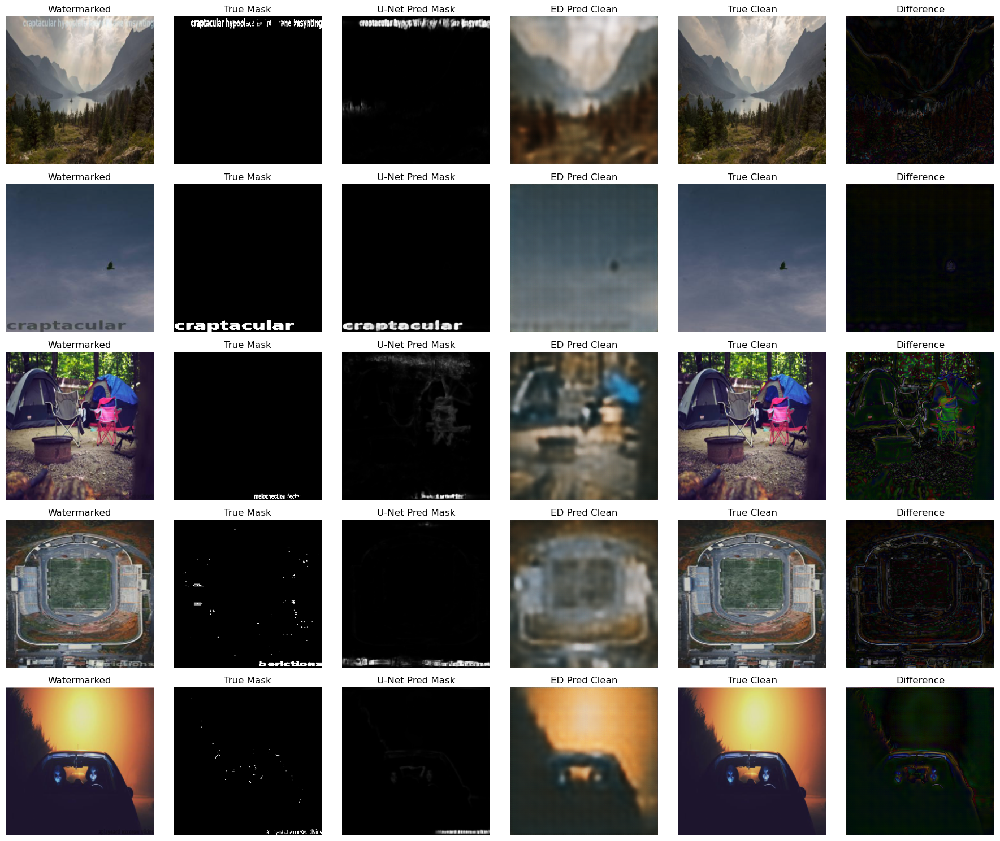

In [ ]:
# Visualize results

visualize_results(unet, encoder_decoder, test_loader, num_samples=5)


## Quantitative Evaluation


In [18]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import torch.nn.functional as F

def evaluate_unet(model, test_loader):
    """
    Evaluate U-Net with segmentation metrics.
    """
    model.eval()
    all_preds = []
    all_targets = []
    
    with torch.no_grad():
        for watermark_imgs, _, mask_imgs in tqdm(test_loader, desc="Evaluating U-Net"):
            watermark_imgs = watermark_imgs.to(device)
            mask_imgs = mask_imgs.to(device)
            
            pred_masks = model(watermark_imgs)
            
            # Threshold predictions
            pred_binary = (pred_masks > 0.5).float()
            
            all_preds.append(pred_binary.cpu().numpy().flatten())
            all_targets.append(mask_imgs.cpu().numpy().flatten())
    
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    
    accuracy = accuracy_score(all_targets, all_preds)
    precision = precision_score(all_targets, all_preds, zero_division=0)
    recall = recall_score(all_targets, all_preds, zero_division=0)
    f1 = f1_score(all_targets, all_preds, zero_division=0)
    
    print("\n=== U-Net Segmentation Metrics ===")
    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1:.4f}")
    
    return accuracy, precision, recall, f1

def evaluate_encoder_decoder(model, test_loader):
    """
    Evaluate Encoder-Decoder with image quality metrics.
    """
    model.eval()
    total_l1 = 0.0
    total_mse = 0.0
    total_psnr = 0.0
    num_batches = 0
    
    with torch.no_grad():
        for watermark_imgs, clean_imgs, _ in tqdm(test_loader, desc="Evaluating Encoder-Decoder"):
            watermark_imgs = watermark_imgs.to(device)
            clean_imgs = clean_imgs.to(device)
            
            pred_clean = model(watermark_imgs)
            
            # L1 loss
            l1 = F.l1_loss(pred_clean, clean_imgs).item()
            
            # MSE loss
            mse = F.mse_loss(pred_clean, clean_imgs).item()
            
            # PSNR
            psnr = 10 * np.log10(1.0 / mse) if mse > 0 else 100
            
            total_l1 += l1
            total_mse += mse
            total_psnr += psnr
            num_batches += 1
    
    avg_l1 = total_l1 / num_batches
    avg_mse = total_mse / num_batches
    avg_psnr = total_psnr / num_batches
    
    print("\n=== Encoder-Decoder Image Quality Metrics ===")
    print(f"L1 Loss:   {avg_l1:.4f}")
    print(f"MSE Loss:  {avg_mse:.4f}")
    print(f"PSNR:      {avg_psnr:.2f} dB")
    
    return avg_l1, avg_mse, avg_psnr


In [19]:
# Evaluate both models
unet_metrics = evaluate_unet(unet, test_loader)
ed_metrics = evaluate_encoder_decoder(encoder_decoder, test_loader)


Evaluating U-Net: 100%|██████████| 33/33 [00:36<00:00,  1.11s/it]



=== U-Net Segmentation Metrics ===
Accuracy:  0.9804
Precision: 0.8153
Recall:    0.6085
F1 Score:  0.6969


Evaluating Encoder-Decoder: 100%|██████████| 33/33 [00:04<00:00,  7.09it/s]


=== Encoder-Decoder Image Quality Metrics ===
L1 Loss:   0.1131
MSE Loss:  0.0302
PSNR:      15.36 dB


## Model Comparison Summary


In [25]:
# Create comprehensive comparison summary
print("="*80)
print("MODEL PERFORMANCE COMPARISON SUMMARY".center(80))
print("="*80)
print()

# Model Parameters
print("📊 MODEL ARCHITECTURE")
print("-" * 80)
unet_params = sum(p.numel() for p in unet.parameters())
ed_params = sum(p.numel() for p in encoder_decoder.parameters())
print(f"{'Model':<30} {'Parameters':<20} {'Task':<30}")
print(f"{'U-Net':<30} {unet_params:>15,} {'Segmentation (Detection)':<30}")
print(f"{'Encoder-Decoder':<30} {ed_params:>15,} {'Translation (Removal)':<30}")
print()

# U-Net Metrics
print("🎯 U-NET SEGMENTATION METRICS (Test Set)")
print("-" * 80)
accuracy, precision, recall, f1 = unet_metrics
print(f"{'Metric':<30} {'Value':<20} {'Interpretation':<30}")
print(f"{'Accuracy':<30} {accuracy:>8.4f} {'Pixel-level correctness':<30}")
print(f"{'Precision':<30} {precision:>8.4f} {'Correct watermark detections':<30}")
print(f"{'Recall':<30} {recall:>8.4f} {'Watermark pixels found':<30}")
print(f"{'F1 Score':<30} {f1:>8.4f} {'Harmonic mean of P & R':<30}")
print()

# Encoder-Decoder Metrics  
print("🧹 ENCODER-DECODER REMOVAL METRICS (Test Set)")
print("-" * 80)
l1, mse, psnr = ed_metrics
print(f"{'Metric':<30} {'Value':<20} {'Interpretation':<30}")
print(f"{'L1 Loss':<30} {l1:>8.4f} {'Mean absolute pixel error':<30}")
print(f"{'MSE Loss':<30} {mse:>8.4f} {'Mean squared pixel error':<30}")
print(f"{'PSNR (dB)':<30} {psnr:>8.2f} {'Signal quality (higher=better)':<30}")
print()

# Performance Summary
print("📈 PERFORMANCE SUMMARY")
print("-" * 80)
print(f"✓ U-Net achieves {accuracy*100:.2f}% pixel accuracy in detecting watermarks")
print(f"✓ U-Net F1 Score of {f1:.4f} indicates {'good' if f1 > 0.7 else 'moderate'} detection performance")
print(f"✓ Encoder-Decoder achieves {psnr:.2f} dB PSNR for watermark removal")
print(f"✓ Encoder-Decoder L1 Loss of {l1:.4f} shows {'low' if l1 < 0.15 else 'moderate'} reconstruction error")
print()

# Training Summary
print("🎓 TRAINING CONFIGURATION")
print("-" * 80)
print(f"Training Set:       {len(train_pairs):,} pairs")
print(f"Validation Set:     {len(val_pairs):,} pairs")
print(f"Test Set:           {len(test_pairs):,} pairs")
print(f"Epochs:             20")
print(f"Batch Size:         8")
print(f"Image Size:         256×256")
print(f"U-Net Loss:         Binary Cross Entropy (BCE)")
print(f"ED Loss:            L1 (MAE)")
print("="*80)


                      MODEL PERFORMANCE COMPARISON SUMMARY                      

📊 MODEL ARCHITECTURE
--------------------------------------------------------------------------------
Model                          Parameters           Task                          
U-Net                               31,043,521 Segmentation (Detection)      
Encoder-Decoder                     13,905,923 Translation (Removal)         

🎯 U-NET SEGMENTATION METRICS (Test Set)
--------------------------------------------------------------------------------
Metric                         Value                Interpretation                
Accuracy                         0.9804 Pixel-level correctness       
Precision                        0.8153 Correct watermark detections  
Recall                           0.6085 Watermark pixels found        
F1 Score                         0.6969 Harmonic mean of P & R        

🧹 ENCODER-DECODER REMOVAL METRICS (Test Set)
------------------------------------------

## Save Final Models


In [26]:
# Save final models
torch.save(unet.state_dict(), 'unet_final.pth')
torch.save(encoder_decoder.state_dict(), 'encoder_decoder_final.pth')
print("✅ Models saved successfully!")


✅ Models saved successfully!
